# Features analysis

In [29]:
import sys

my_path = r'/home/ilaria/Scrivania/Machine_Learning/Project_1/Project1_ML'
sys.path.insert(0,my_path + r'/code/COMMON')

import numpy as np
import matplotlib.pyplot as plt
from proj1_helpers import load_csv_data 
from implementations import least_squares
from standard import standardize

In [30]:
yb, input_data, ids = load_csv_data(my_path + r'/data/train.csv', sub_sample=False)

In [31]:
input_data.shape

(250000, 30)

## Remove -999 or substitution with mean

In [32]:
from outliers import handle_outliers

X,Y = handle_outliers(input_data,yb, -999, 1) #deleting the whole row

samples with -999 are removed from the dataset 


In [33]:
Xstd, mean_X, std_X = standardize(X)    
Xstd.shape


(68114, 30)

## 2 Histograms per feature

In [34]:
from labels import idx_2labels

In [35]:
featureNames = np.genfromtxt(my_path + r'/data/train.csv', delimiter=",", dtype=str, max_rows = 1)[2:]

#Subdivision of the features in derivated and primitives
x_der = Xstd[:,:13]
name_der = featureNames[:13]
x_pri = Xstd[:,13:]
name_pri = featureNames[13:]

ind_background, ind_signal = idx_2labels(Y, [-1, 1])
  
    



### Derived features

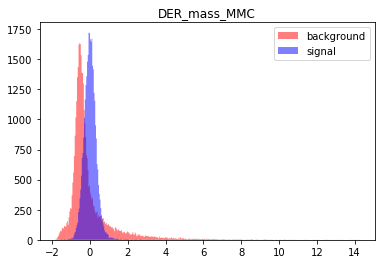

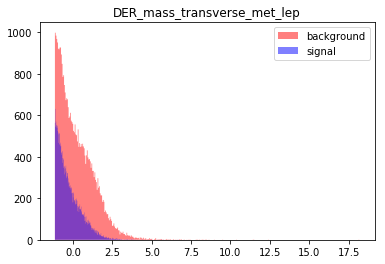

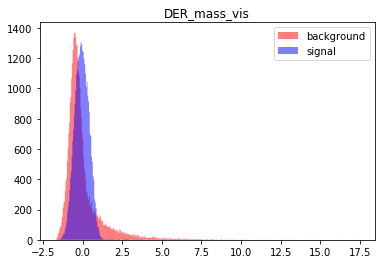

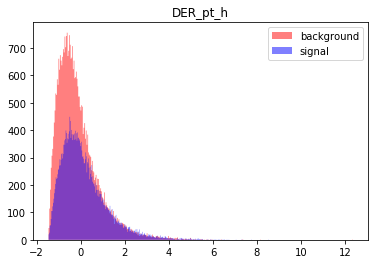

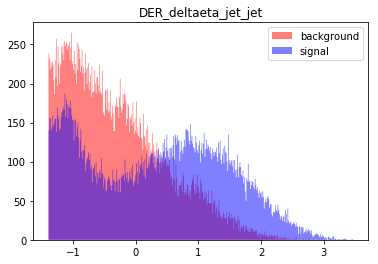

...

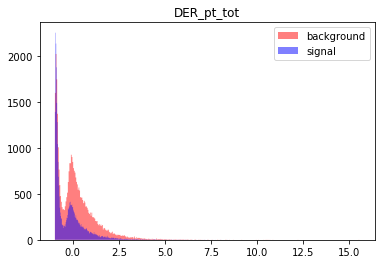

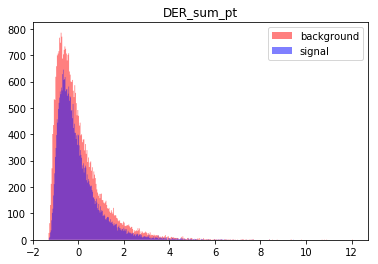

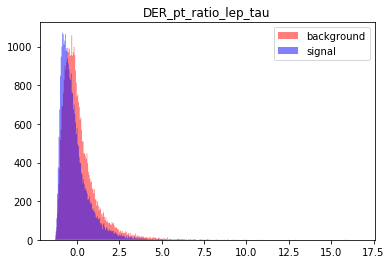

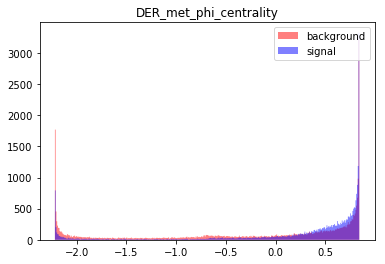

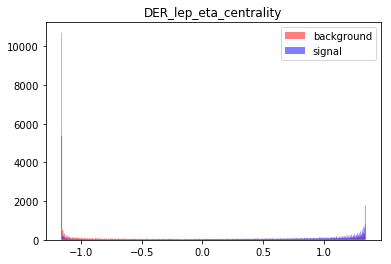

In [36]:
for i in range(x_der.shape[1]):
    plt.title(name_der[i])
    plt.hist([x_der[ind_background,i]], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([x_der[ind_signal,i]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background', 'signal'])
    
    plt.show()
    

#### Logaritmic transformation of meaningfull features (Derived)

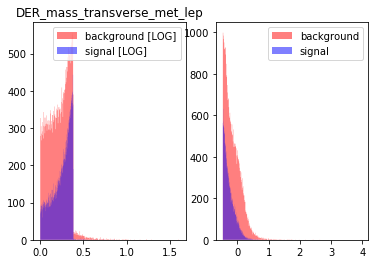

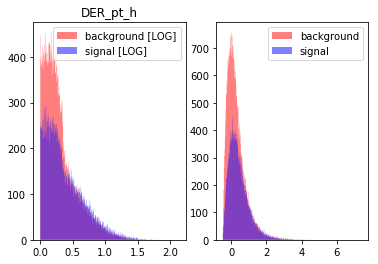

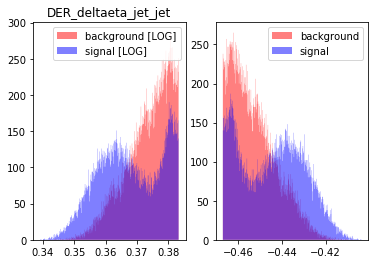

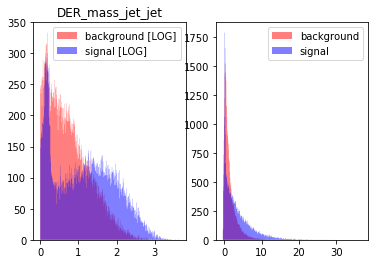

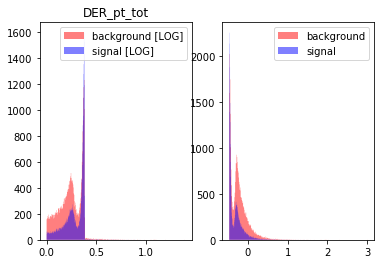

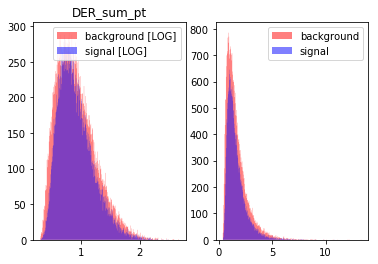

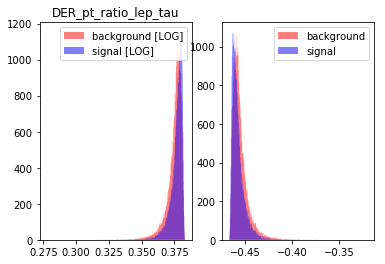

In [10]:
der_log = [1, 3, 4, 5, 8, 9, 10]
x_der_log = x_der[:, der_log]

for i in range(x_der_log.shape[1]):
    plt.subplot(121)
    plt.title(name_der[der_log[i]])
    plt.hist([np.log(1+ np.abs(x_der_log[ind_background,i]))], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([np.log(1+ np.abs(x_der_log[ind_signal,i]))],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background [LOG]', 'signal [LOG]'])
    
    plt.subplot(122)
    plt.hist([x_der_log[ind_background,i]], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([x_der_log[ind_signal,i]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background', 'signal'])
    plt.show()


### Primative features

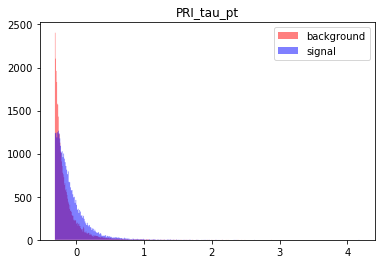

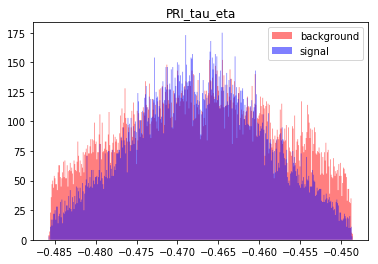

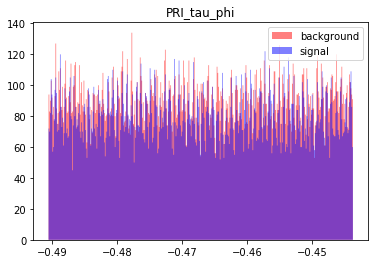

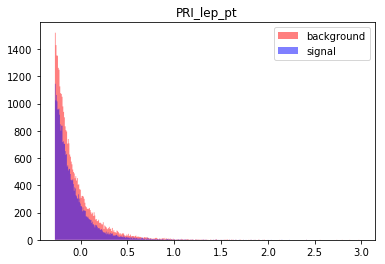

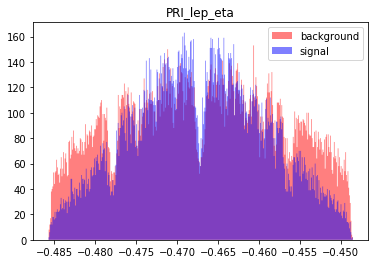

...

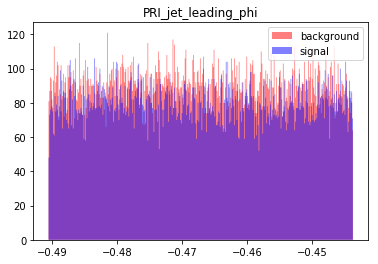

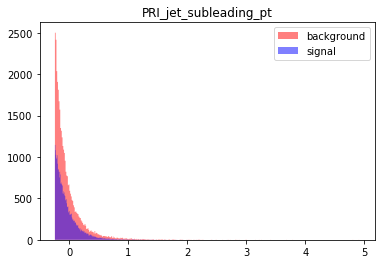

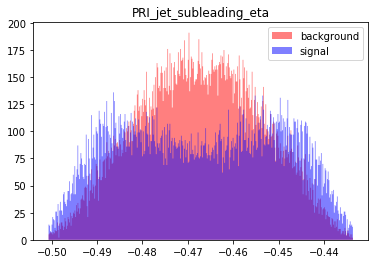

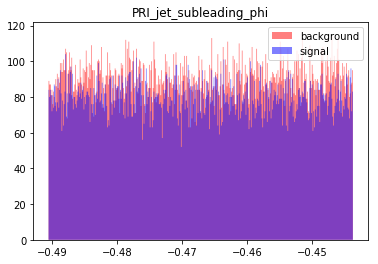

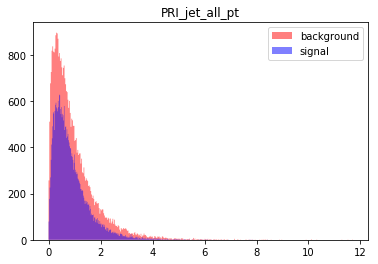

In [10]:
for i in range(x_pri.shape[1]):
    plt.title(name_pri[i])
    plt.hist([x_pri[ind_background,i]], bins=400, color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([x_pri[ind_signal,i]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background', 'signal'])
    
    plt.show()

#### Logaritmic transformation of meaningfull features (Primitive)

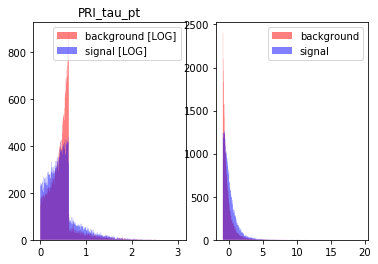

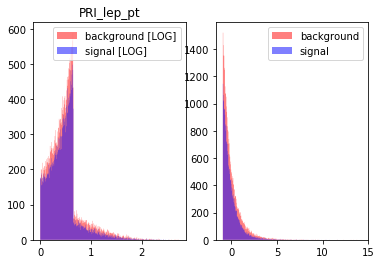

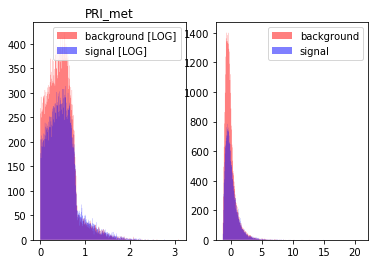

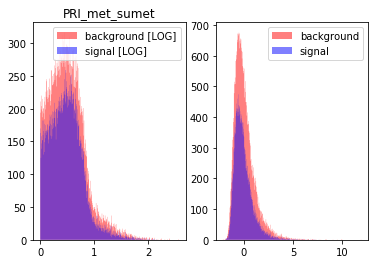

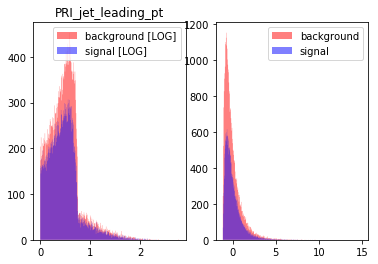

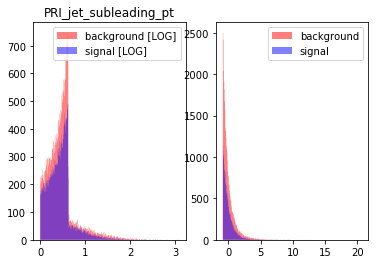

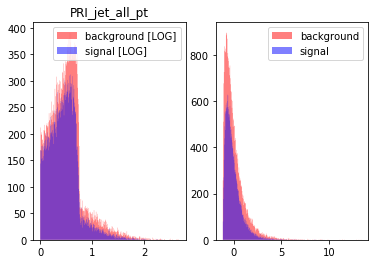

In [8]:
pri_log = [0,3,6,8, 10, 13,16]
x_pri_log = x_pri[:,pri_log]

for i in range(x_pri_log.shape[1]):
    plt.subplot(121)
    plt.title(name_pri[pri_log[i]])
    plt.hist([np.log(1+np.abs(x_pri_log[ind_background,i]))], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([np.log(1+np.abs(x_pri_log[ind_signal,i]))],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background [LOG]', 'signal [LOG]'])
    
    plt.subplot(122)
    plt.hist([x_pri_log[ind_background,i]], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([x_pri_log[ind_signal,i]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background', 'signal'])
    
    plt.show()


# Scatter plots of signals and backgrounds

In [9]:
def plotInFeatureSpace(samples, labels, ind1, ind2, featureNames):
    
    # extract feature 1 and feature 2 at index 'ind1' and 'ind2' in 'samples'
    F1 = samples[:, ind1]
    F2 = samples[:, ind2]
    
    # get background event in F1 and F2 (the label in 'labels' is -1)
    ind_background = np.where(labels == -1)
    F1_background = F1[ind_background]
    F2_background = F2[ind_background]
    
    # get signal event in F1 and F2 (the label in 'labels' is +1)
    ind_signal = np.where(labels == 1)
    F1_signal = F1[ind_signal]
    F2_signal = F2[ind_signal]

    # plot background
    plt.subplot(121)
    plt.plot(F1_background, F2_background, 'o', color='blue')
    plt.plot(F1_signal, F2_signal, '*', color='red')
    plt.legend(("background", "signal"))
    plt.xlabel(featureNames[ind1])
    plt.ylabel(featureNames[ind2])
    
    # plot signal (higgs boson signature)
    plt.subplot(122)
    plt.plot(F1_signal, F2_signal, '*', color='red')
    plt.plot(F1_background, F2_background, 'o', color='blue')
    plt.legend(("signal", "background"))
    plt.xlabel(featureNames[ind1])
    plt.ylabel(featureNames[ind2])
    
    plt.show()

### Derivative features

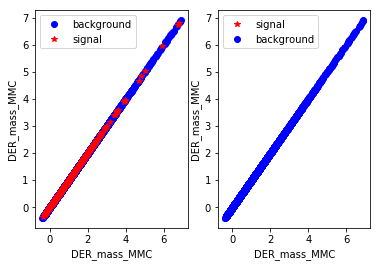

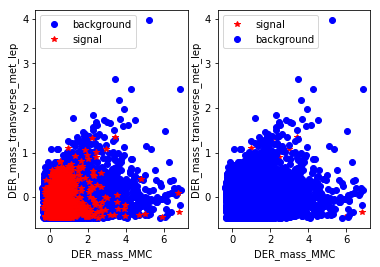

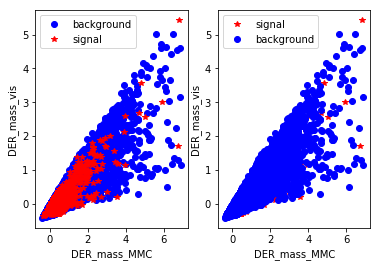

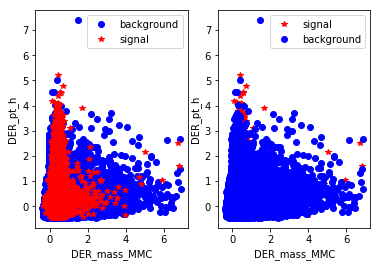

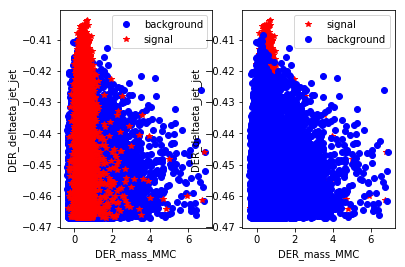

...

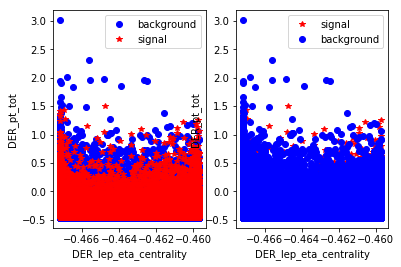

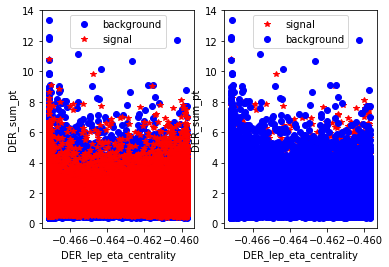

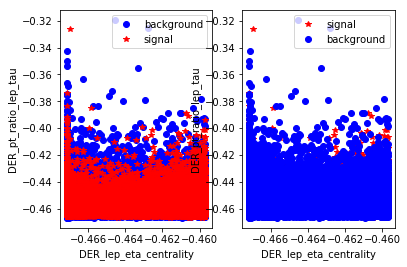

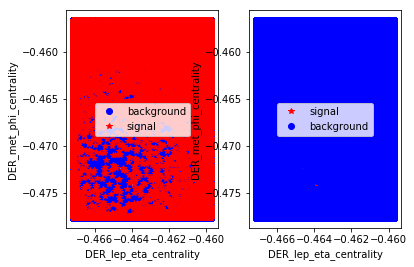

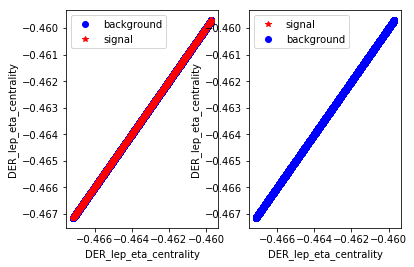

In [13]:
for i in range(x_der.shape[1]):
    for j in range(x_der.shape[1]):
        plotInFeatureSpace(x_der, Y, i, j, name_der)

### Primitive features

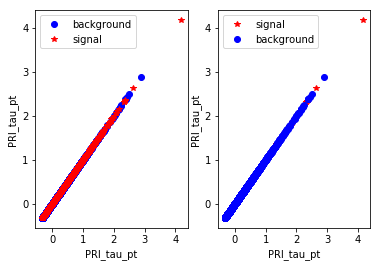

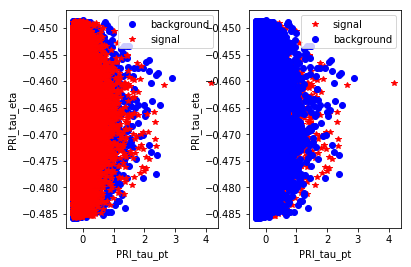

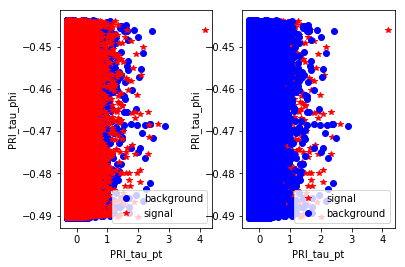

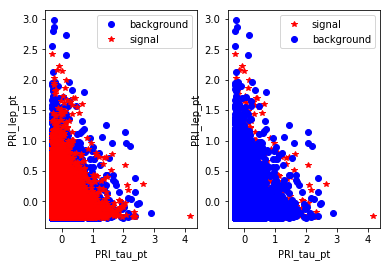

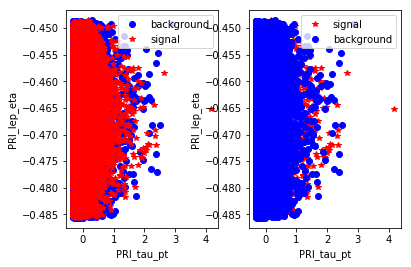

...

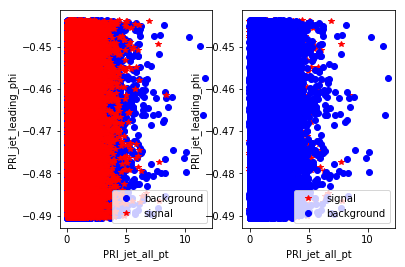

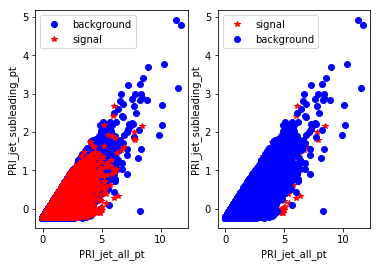

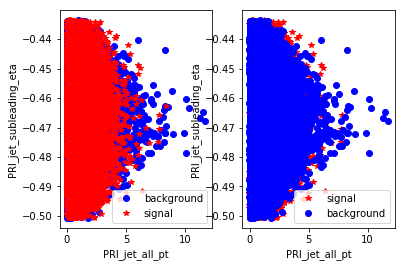

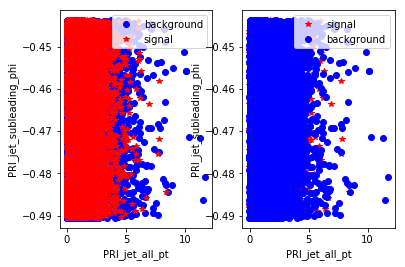

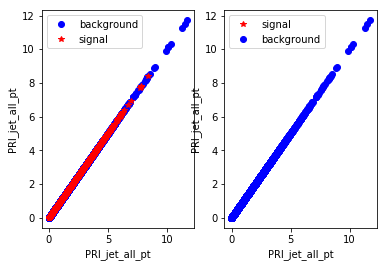

In [14]:
for i in range(x_pri.shape[1]):
    for j in range(x_pri.shape[1]):
        plotInFeatureSpace(x_pri, Y, i, j, name_pri)

# Fisher information

In [10]:
def getFisher(samples_back, samples_sig):
        
    # compute mean and standard deviations
    m_b = np.mean(samples_back)
    m_s = np.mean(samples_sig)
    std_b = np.std(samples_back)
    std_s = np.std(samples_sig)

    # calculate the Fisher information
    fisher = (m_b-m_s)**2 / (std_b + std_s)
    
    return fisher

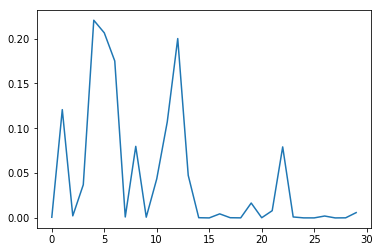

PRI_jet_subleading_eta (index: 27 ,fisher value: 2.5493002988e-06 )
DER_deltaeta_jet_jet (index: 4 ,fisher value: 0.220567554164 )
DER_mass_jet_jet (index: 5 ,fisher value: 0.206522361838 )
DER_lep_eta_centrality (index: 12 ,fisher value: 0.200128484188 )
DER_prodeta_jet_jet (index: 6 ,fisher value: 0.175109525393 )
DER_mass_transverse_met_lep (index: 1 ,fisher value: 0.120819083584 )
DER_met_phi_centrality (index: 11 ,fisher value: 0.107030456445 )
DER_pt_tot (index: 8 ,fisher value: 0.0798481875613 )
PRI_jet_num (index: 22 ,fisher value: 0.0792455941231 )
PRI_tau_pt (index: 13 ,fisher value: 0.0475013408663 )


In [11]:
# compute the fisher information value for all the features 
fisher = []
for i in range(X.shape[1]):
    fisher.append(getFisher(Xstd[ind_background,i],Xstd[ind_signal,i]))

# plot them

plt.plot(np.arange(len(fisher)),fisher)  
plt.show()

# extract the P best features
P = 10
ind_sort = np.argsort(fisher)
for i in range(P):
    print(featureNames[ind_sort[-i]],'(index:',ind_sort[-i],',fisher value:',fisher[ind_sort[-i]],')')


In [15]:
fisher.sort()
fisher

[2.5493002987957374e-06,
 8.0595492020076665e-06,
 2.5246622823311695e-05,
 4.9611396829724805e-05,
 6.3315808340233954e-05,
 0.00010753465806307754,
 0.00019703558215988882,
 0.00022113442190890655,
 0.00023559037704508606,
 0.0007495804154999551,
 0.00083969929248670463,
 0.0010530039414389371,
 0.0010667289845200489,
 0.002115751240400891,
 0.002296985059705972,
 0.0045192088791896545,
 0.0059131749213170697,
 0.0080558263800257247,
 0.016610717653432555,
 0.036993510723312854,
 0.043580218100753632,
 0.047501340866324605,
 0.079245594123085045,
 0.079848187561270753,
 0.10703045644463632,
 0.12081908358375004,
 0.17510952539347738,
 0.20012848418815068,
 0.20652236183764239,
 0.22056755416359444]

# Cross correlation 

##### This is quite useless

In [12]:
cc = []
features_cc = []
for i in range(Xstd.shape[1]):
    cc.append(np.correlate(Xstd[ind_background[0], i], Xstd[ind_signal[0],i]))
    # I take the worst case (minimum)
    features_cc.append(np.min(cc[i]))
    

In [13]:
cc_sort = np.argsort(features_cc)

tupla = [(features_cc[cc_sort[i]], featureNames[cc_sort[i]]) for i in range(30)]
sorted(tupla, reverse=True)

[(153766.73035352287, 'DER_mass_jet_jet'),
 (129739.85861737456, 'PRI_met_sumet'),
 (84208.420098769653, 'DER_sum_pt'),
 (25213.406433552842, 'PRI_jet_all_pt'),
 (7169.3560672763169, 'DER_prodeta_jet_jet'),
 (6962.659060975926, 'PRI_jet_leading_phi'),
 (6962.2210825117709, 'PRI_jet_subleading_eta'),
 (6961.4169800190848, 'PRI_jet_subleading_phi'),
 (6961.1379625194459, 'PRI_jet_leading_eta'),
 (6961.1346082826603, 'PRI_lep_eta'),
 (6961.0421826579668, 'PRI_tau_eta'),
 (6959.7568876976129, 'PRI_tau_phi'),
 (6957.622650511119, 'PRI_met_phi'),
 (6950.090896444025, 'PRI_lep_phi'),
 (6855.9903450688553, 'DER_lep_eta_centrality'),
 (6816.2395234662808, 'DER_met_phi_centrality'),
 (6636.9838360727263, 'DER_pt_ratio_lep_tau'),
 (6523.939731674358, 'DER_deltar_tau_lep'),
 (6459.0510620194655, 'PRI_jet_num'),
 (6422.0863132985414, 'DER_deltaeta_jet_jet'),
 (6351.9417863251656, 'DER_mass_MMC'),
 (3945.3831056812414, 'DER_pt_h'),
 (3302.599106303388, 'PRI_jet_leading_pt'),
 (2172.2725691873193, 'D

# Plots log(masses)

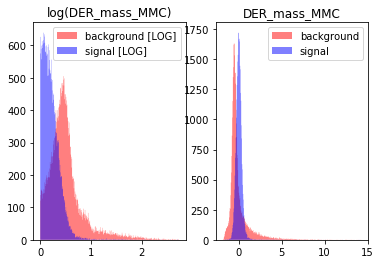

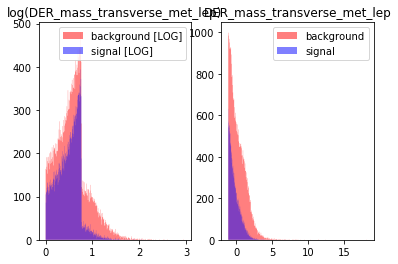

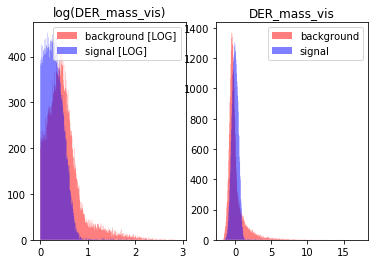

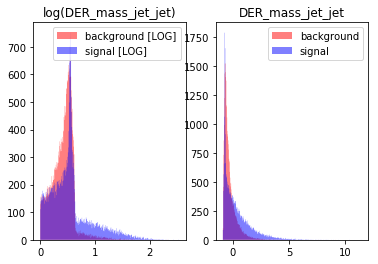

In [9]:
mas_log = [0,1,2,5]
x_log = Xstd[:,mas_log]

log_names = []
for i in range(x_log.shape[1]):
    log_names.append('log(' + featureNames[mas_log[i]] + ')')

for i in range(x_log.shape[1]):
    plt.subplot(121)
    plt.title(log_names[i])
    plt.hist([np.log(1+np.abs(x_log[ind_background,i]))], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([np.log(1+np.abs(x_log[ind_signal,i]))],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background [LOG]', 'signal [LOG]'])
    
    plt.subplot(122)
    plt.title(featureNames[mas_log[i]])
    plt.hist([x_log[ind_background,i]], bins=400,color='r', alpha=0.5,histtype='stepfilled')
    plt.hist([x_log[ind_signal,i]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
    plt.legend(['background', 'signal'])
    
    plt.show()
    
    

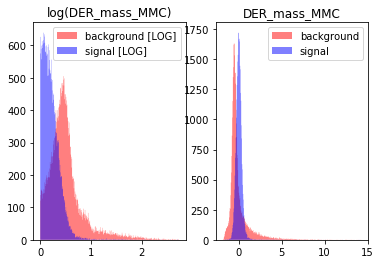

In [11]:
plt.subplot(121)
plt.title(log_names[0])
plt.hist([np.log(1+np.abs(x_log[ind_background,0]))], bins=400,color='r', alpha=0.5,histtype='stepfilled')
plt.hist([np.log(1+np.abs(x_log[ind_signal,0]))],bins=400, color='b', alpha=0.5,histtype='stepfilled')
plt.legend(['background [LOG]', 'signal [LOG]'])

plt.subplot(122)
plt.title(featureNames[mas_log[0]])
plt.hist([x_log[ind_background,0]], bins=400,color='r', alpha=0.5,histtype='stepfilled')
plt.hist([x_log[ind_signal,0]],bins=400, color='b', alpha=0.5,histtype='stepfilled')
plt.legend(['background', 'signal'])
plt.savefig("logmas")
plt.show()